In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1.1 Block Matching

Block Matching (SAD / SSD)

In [18]:
def compute_disparity_block_matching(Il, Ir, max_disp, window_size, cost_type="SAD"):
    h, w = Il.shape
    disparity = np.zeros((h, w), dtype=np.float32)

    half = window_size // 2

    # Pad images to avoid border issues
    Il_pad = cv2.copyMakeBorder(Il, half, half, half, half, cv2.BORDER_REFLECT)
    Ir_pad = cv2.copyMakeBorder(Ir, half, half, half, half, cv2.BORDER_REFLECT)

    # Loop through each pixel
    for y in range(half, h + half):
        print(f"Processing row {y-half+1}/{h}", end="\r")

        for x in range(half, w + half):

            best_cost = np.inf
            best_disp = 0

            # Extract the window in the LEFT image
            block_l = Il_pad[y-half:y+half+1, x-half:x+half+1]

            # Search for the best disparity
            for d in range(max_disp):

                xr = x - d   # shifted x coordinate in right image
                if xr - half < 0:
                    continue

                block_r = Ir_pad[y-half:y+half+1, xr-half:xr+half+1]

                # Compute the cost
                if cost_type == "SAD":
                    cost = np.sum(np.abs(block_l - block_r))
                else:  # SSD
                    cost = np.sum((block_l - block_r)**2)

                # Find minimum cost
                if cost < best_cost:
                    best_cost = cost
                    best_disp = d

            disparity[y-half, x-half] = best_disp

    return disparity

Run block matching

In [22]:
image_pairs = [
    ("/kaggle/input/resources/l3.png",
     "/kaggle/input/resources/r3.png","teddy"),
    ("/kaggle/input/resources/l2.png",
     "/kaggle/input/resources/r2.png","cones"),
    ("/kaggle/input/resources/l1.png",
     "/kaggle/input/resources/r1.png","state")
]

window_sizes = [1, 5, 9]
max_disp_candidates = [40] 

all_results = {}  

for left_path, right_path, name in image_pairs:
    print(f"\n=== Processing image pair: {name} ===")

    Il = cv2.imread(left_path, cv2.IMREAD_GRAYSCALE)
    Ir = cv2.imread(right_path, cv2.IMREAD_GRAYSCALE)

    if Il is None or Ir is None:
        raise Exception(f"Error: Could not load images for {name}")

    results = {} 

    for w in window_sizes:
        for cost_type in ['SAD', 'SSD']:
            best_total_cost = np.inf
            best_max_disp = None
            best_dmap = None

            print(f"\n--- Testing window size = {w}, cost = {cost_type} ---")

            for md in max_disp_candidates:
                print(f"Trying max_disp = {md} ...")
                disp = compute_disparity_block_matching(Il, Ir, md, w, cost_type)
                total_cost = np.sum(disp)

                if total_cost < best_total_cost:
                    best_total_cost = total_cost
                    best_max_disp = md
                    best_dmap = disp

            print(f"Best max_disp for window {w}, cost {cost_type} = {best_max_disp}")
            results[f"{cost_type}_best_w{w}"] = best_dmap

    all_results[name] = results  


=== Processing image pair: teddy ===

--- Testing window size = 1, cost = SAD ---
Trying max_disp = 40 ...
Best max_disp for window 1, cost SAD = 40

--- Testing window size = 1, cost = SSD ---
Trying max_disp = 40 ...
Best max_disp for window 1, cost SSD = 40

--- Testing window size = 5, cost = SAD ---
Trying max_disp = 40 ...
Best max_disp for window 5, cost SAD = 40

--- Testing window size = 5, cost = SSD ---
Trying max_disp = 40 ...
Best max_disp for window 5, cost SSD = 40

--- Testing window size = 9, cost = SAD ---
Trying max_disp = 40 ...
Best max_disp for window 9, cost SAD = 40

--- Testing window size = 9, cost = SSD ---
Trying max_disp = 40 ...
Best max_disp for window 9, cost SSD = 40

=== Processing image pair: cones ===

--- Testing window size = 1, cost = SAD ---
Trying max_disp = 40 ...
Best max_disp for window 1, cost SAD = 40

--- Testing window size = 1, cost = SSD ---
Trying max_disp = 40 ...
Best max_disp for window 1, cost SSD = 40

--- Testing window size = 5

Display the 6 disparity maps

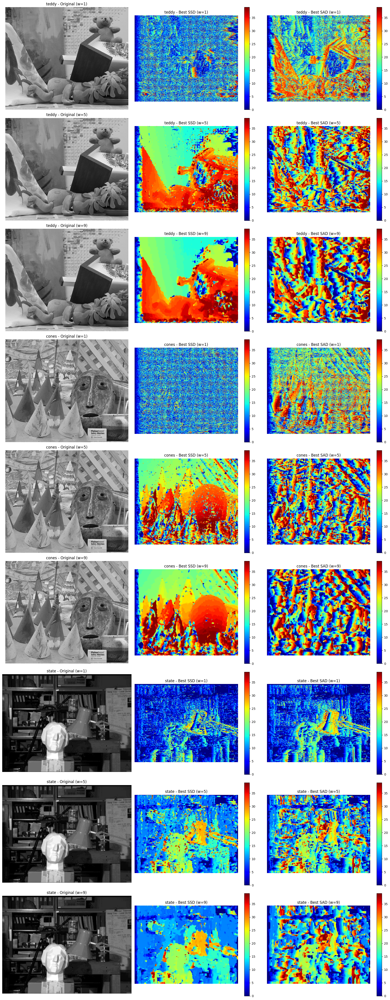

In [23]:
import matplotlib.pyplot as plt

window_sizes = [1, 5, 9]


n_rows = len(window_sizes) * len(all_results)
plt.figure(figsize=(18, 5 * n_rows))

row_idx = 0  

for name, results in all_results.items():
    for w in window_sizes:
        
        plt.subplot(n_rows, 3, row_idx*3 + 1)
     
        if name == 'teddy':
            Il = cv2.imread("/kaggle/input/resources/l3.png", cv2.IMREAD_GRAYSCALE)
        elif name=='cones':
            Il = cv2.imread("/kaggle/input/resources/l2.png", cv2.IMREAD_GRAYSCALE)
        else :
            Il = cv2.imread("/kaggle/input/resources/l1.png", cv2.IMREAD_GRAYSCALE)
            
        plt.imshow(Il, cmap='gray')
        plt.title(f'{name} - Original (w={w})')
        plt.axis('off')

       
        key_ssd = f'SSD_best_w{w}'
        plt.subplot(n_rows, 3, row_idx*3 + 2)
        plt.imshow(results[key_ssd], cmap='jet')
        plt.title(f'{name} - Best SSD (w={w})')
        plt.colorbar()
        plt.axis('off')

        
        key_sad = f'SAD_best_w{w}'
        plt.subplot(n_rows, 3, row_idx*3 + 3)
        plt.imshow(results[key_sad], cmap='jet')
        plt.title(f'{name} - Best SAD (w={w})')
        plt.colorbar()
        plt.axis('off')

        row_idx += 1

plt.tight_layout()
plt.show()

# 1.2 Dynamic Programming

In [5]:
Il = cv2.imread("/kaggle/input/resources/l1.png", cv2.IMREAD_GRAYSCALE)
Ir = cv2.imread("/kaggle/input/resources/r1.png", cv2.IMREAD_GRAYSCALE)

In [6]:
def disparity_cost(i, j, sigma=2):
    diff = i.astype(np.float64) - j.astype(np.float64)
    
    return np.power(diff, 2) / (sigma ** 2)


In [7]:

def row_disparity(Il, Ir, row_idx, c0=1, sigma=2):
    h, w = Il.shape
    dp = np.zeros((w+1, w+1))

    l_row = Il[row_idx]
    r_row = Ir[row_idx]

    # for i in range(w+1):
    #     dp[0, i] = i * c0
    #     dp[i, 0] = i * c0

    dp = np.full((w+1, w+1), np.inf)
    dp[0,0] = 0

    for i in range(1,w+1):
        for j in range(1,w+1):
            d = disparity_cost(l_row[i-1], r_row[j-1], sigma=sigma)
            dp[i, j] = min(dp[i-1, j-1] + d,
                          dp[i, j-1] + c0,
                          dp[i-1, j] + c0)

    
    return dp


row_disparity(Il, Ir, 0)
    

array([[  0.,  inf,  inf, ...,  inf,  inf,  inf],
       [ inf,   0.,   1., ..., 379., 380., 381.],
       [ inf,   1.,   0., ..., 378., 379., 380.],
       ...,
       [ inf, 379., 378., ...,   0.,   1.,   2.],
       [ inf, 380., 379., ...,   1.,   0.,   1.],
       [ inf, 381., 380., ...,   2.,   1.,   0.]])

In [8]:
from tqdm import tqdm

def backtracking(Il, Ir, c0=1, sigma=2):
    D_left = np.zeros_like(Il) # left dispartiy map h * w
    D_right = np.zeros_like(Il) # left dispartiy map
    h , w = Il.shape 
    
    for row in tqdm(range(h)):
        dp = row_disparity(Il, Ir, row, c0=1, sigma=2) # w+1 * w+1
        l_row = Il[row]
        r_row = Ir[row]
        i , j = w, w
        while i > 0 and j > 0:
            d = disparity_cost(l_row[i-1], r_row[j-1], sigma=sigma)
        
            if dp[i][j] == dp[i-1][j-1] + d:
                # match
                D_left[row, i-1]  = abs(i-j)
                D_right[row, j-1] = abs(i-j)
                i -= 1
                j -= 1
            
            elif dp[i][j] == dp[i-1][j] + c0:
                # skip left pixel
                D_left[row, i-1] = 0
                i -= 1
            
            else:
                # skip right pixel
                D_right[row, j-1] = 0
                j -= 1


    return D_left, D_right
            

In [9]:
disp_l, disp_r = backtracking(Il , Ir)

100%|██████████| 289/289 [03:46<00:00,  1.28it/s]


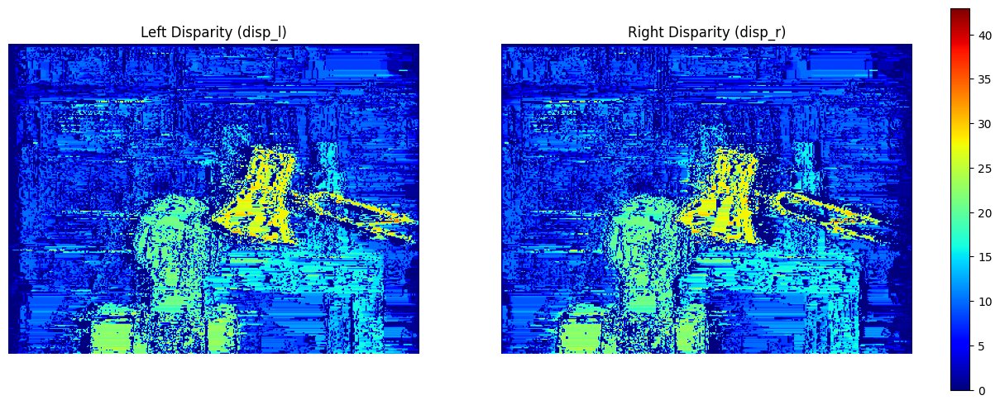

In [10]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

# --- Plot Left Disparity ---

vmin = min(np.min(disp_l), np.min(disp_r))
vmax = max(np.max(disp_l), np.max(disp_r))

im1 = ax[0].imshow(disp_l, cmap='jet', vmin=vmin, vmax=vmax)
ax[0].set_title("Left Disparity (disp_l)")
ax[0].axis('off')  # Turn off axis numbers for a cleaner look

# --- Plot Right Disparity ---
im2 = ax[1].imshow(disp_r, cmap='jet', vmin=vmin, vmax=vmax)
ax[1].set_title("Right Disparity (disp_r)")
ax[1].axis('off')

# --- Add Colorbar ---
# This adds a single colorbar shared by both plots
fig.colorbar(im1, ax=ax, orientation='vertical', fraction=0.02, pad=0.04)
plt.savefig("image2.png")
plt.show()

In [11]:
D_left_clean = cv2.medianBlur(disp_l.astype(np.float32), 3)
D_right_clean = cv2.medianBlur(disp_r.astype(np.float32), 3)

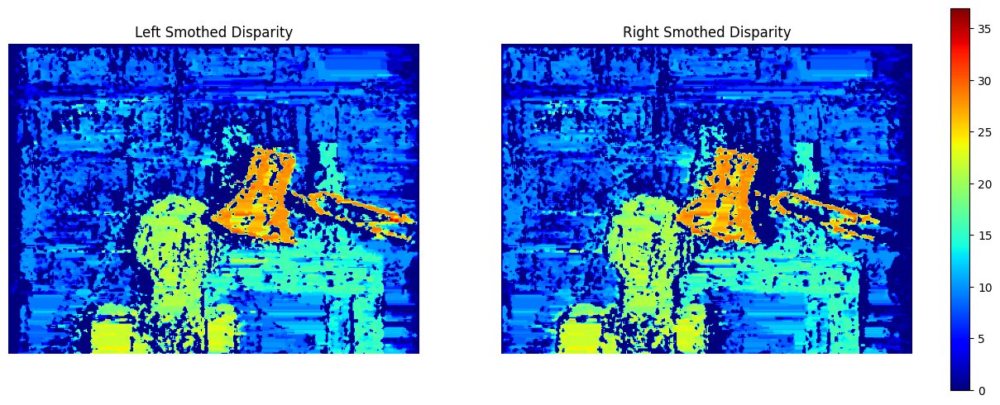

In [12]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

# --- Plot Left Disparity ---

vmin = min(np.min(D_left_clean), np.min(D_right_clean))
vmax = max(np.max(D_left_clean), np.max(D_right_clean))

im1 = ax[0].imshow(D_left_clean, cmap='jet', vmin=vmin, vmax=vmax)
ax[0].set_title("Left Smothed Disparity")
ax[0].axis('off')  # Turn off axis numbers for a cleaner look

# --- Plot Right Disparity ---
im2 = ax[1].imshow(D_right_clean, cmap='jet', vmin=vmin, vmax=vmax)
ax[1].set_title("Right Smothed Disparity")
ax[1].axis('off')

# --- Add Colorbar ---
# This adds a single colorbar shared by both plots
fig.colorbar(im1, ax=ax, orientation='vertical', fraction=0.02, pad=0.04)
plt.savefig("image2smoothed.png")
plt.show()

# Bonus

In [24]:
def print_path(dp):
    _ , w = dp.shape
    i , j = w-1, w-1 
    
    path_x = [j]
    path_y = [i]
    
    while i > 0 and j > 0:

        minimum = min(dp[i-1, j-1],
                      dp[i, j-1],
                      dp[i-1, j])
            
        if minimum == dp[i-1, j-1]:
            # diagonal
            i-=1
            j-=1
        elif minimum == dp[i-1, j]:
            # vertical
            i-=1
        else:
            # horizontal
            j-=1

        path_x.append(j)
        path_y.append(i)


    plt.figure(figsize=(8, 8))
    
    # Plot the path
    plt.plot(path_x, path_y, 'b-', linewidth=2, label='Optimal Path')

    # Formatting to match the requirement
    plt.title("Stereo Matching Path (Backtracking)")
    plt.xlabel("Right Image Scanline ($I_r$)")
    plt.ylabel("Left Image Scanline ($I_l$)")
    
    # Set limits to match the matrix size
    plt.xlim(0, w)
    plt.ylim(0, w)
    
    # Optional: Add a grid and diagonal reference
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.plot([0, w], [0, w], 'r--', alpha=0.3, label='Perfect Diagonal (No Disparity)')
    plt.legend()

    ax = plt.gca()
    ax.invert_yaxis()
    plt.savefig("backtracking.png")
    plt.show()

        

In [26]:
dp = row_disparity(Il, Ir, 374)

print_path(dp)